In [123]:
from tqdm import tqdm
import numpy as np
import pandas as pd
from sklearn.neighbors import LocalOutlierFactor
from sklearn.manifold import TSNE
from umap import UMAP
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 
plt.rcParams.update({'font.size': 30, 'axes.titley':1.01})
c_s = ['g__Bacteroides', 'g__Prevotella', 'g__Ruminococcus']

# Load data

In [3]:
data_pca = {}
for dataset_name in tqdm(['AGP', 'HMP']):
    for tax in ['g']: 
        label = f'{dataset_name}_{tax}'
        data_pca[label] = np.genfromtxt(f'./results/pca/{label}', delimiter=';')
        
        
data_orig = {}
for dataset_name in tqdm(['AGP', 'HMP']):
    for tax in ['g']: 
        dataframe = pd.read_csv(f'./data_processed/{dataset_name}_{tax}.csv', sep=',')
        label = f'{dataset_name}_{tax}'
        data_orig[label] = dataframe.drop('Unnamed: 0', axis=1)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 11.64it/s]


# UMAP 2D: Visualize

In [4]:
Z_umap = {}
for label, X in tqdm(data_pca.items()):
    Z_umap[label] = UMAP(n_components=2, n_jobs=-1, spread=0.7, random_state=42).fit_transform(X)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:37<00:00, 18.86s/it]


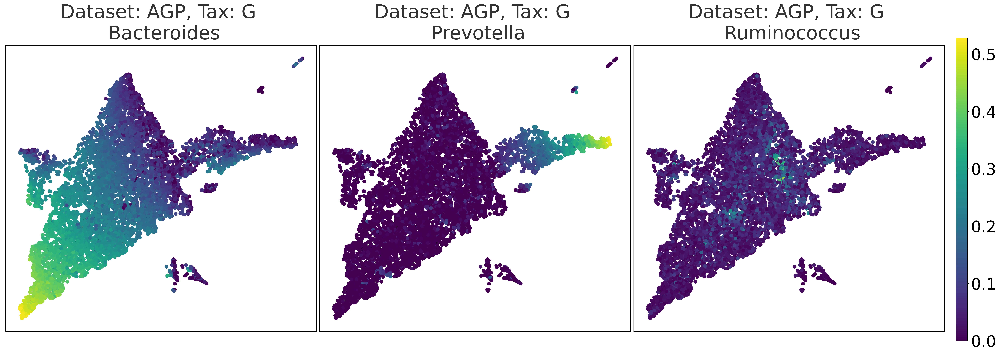

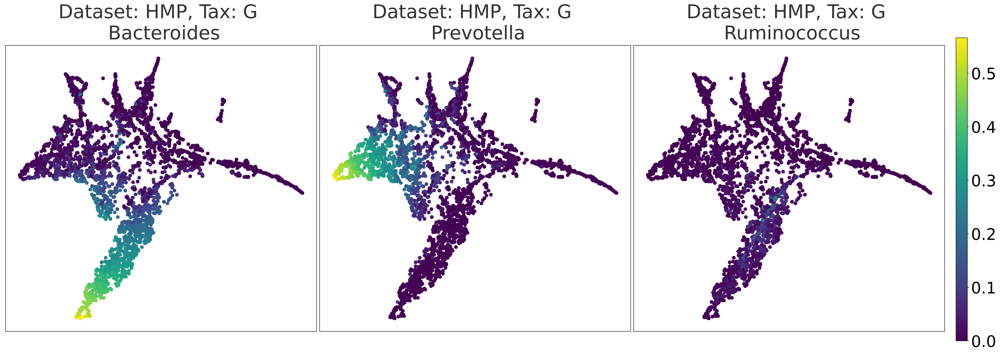

In [124]:
for label, Z in Z_umap.items():
    
    lof_mask = LocalOutlierFactor(n_neighbors=100, contamination=0.1).fit_predict(Z) == 1
    Z = Z[lof_mask]
    
    dataset, tax = label.split('_')
    X_orig = data_orig[dataset + '_' + tax]
    X_orig = X_orig[lof_mask]
        
    fig, axes = plt.subplots(ncols=len(c_s), nrows=1, figsize=(30,10), dpi=400, sharex=True, sharey=True)
    
    for i,c_i in enumerate(c_s):
        mp = axes[i].scatter(Z[:,0], Z[:,1], c=X_orig[c_i])
        c_name = c_i.split('_')[-1]
        axes[i].set_title(f'Dataset: {dataset}, Tax: {tax.capitalize()} \n {c_name}', alpha=0.8)
        axes[i].set_xticks([])
        axes[i].set_yticks([])

    fig.subplots_adjust(right=0.95,
                        wspace=0.01, 
                        hspace=0.01)
    cbar_ax = fig.add_axes([0.96, 0.1, 0.01, 0.8]) # l,b,w,h
    fig.colorbar(mp, cax=cbar_ax)
plt.show()

# t-SNE 2D

In [6]:
Z_tsne = {}
for label, X in tqdm(data_pca.items()):
    Z_tsne[label] = TSNE(n_components=2, early_exaggeration=6, random_state=42, n_jobs=-1).fit_transform(X)

  0%|                                                                                                                                                  | 0/2 [00:00<?, ?it/s]/home/ibulygin/miniconda3/envs/neuro/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/ibulygin/miniconda3/envs/neuro/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
 50%|█████████████████████████████████████████████████████████████████████                                                                     | 1/2 [00:20<00:20, 20.43s/it]/home/ibulygin/miniconda3/envs/neuro/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/ibulygin/miniconda3/envs/neuro

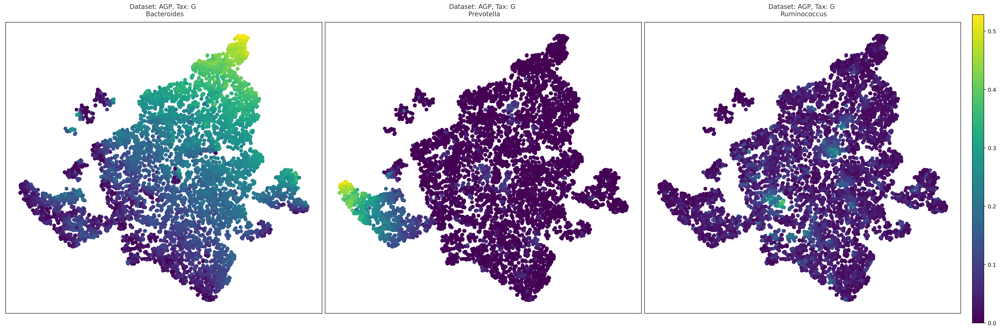

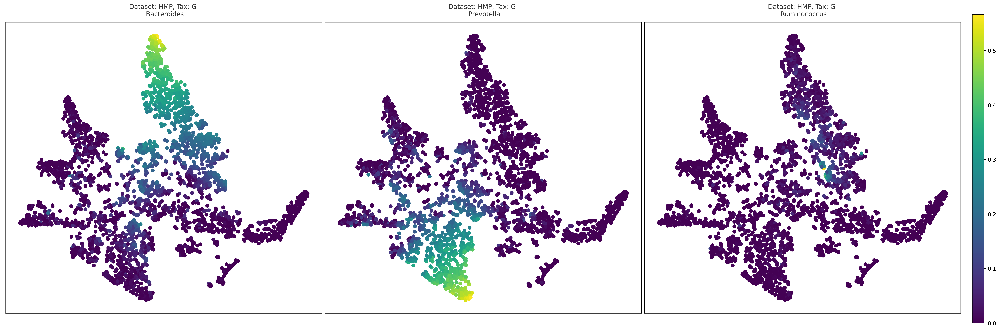

In [7]:
for label, Z in Z_tsne.items():
    
    lof_mask = LocalOutlierFactor(n_neighbors=100, contamination=0.1).fit_predict(Z) == 1
    Z = Z[lof_mask]
    
    dataset, tax = label.split('_')
    X_orig = data_orig[dataset + '_' + tax]
    X_orig = X_orig[lof_mask]
        
    fig, axes = plt.subplots(ncols=len(c_s), nrows=1, figsize=(30,10), dpi=400, sharex=True, sharey=True)
    
    for i,c_i in enumerate(c_s):
        mp = axes[i].scatter(Z[:,0], Z[:,1], c=X_orig[c_i])
        c_name = c_i.split('_')[-1]
        axes[i].set_title(f'Dataset: {dataset}, Tax: {tax.capitalize()} \n {c_name}', alpha=0.8) 
        axes[i].set_xticks([])
        axes[i].set_yticks([])

    fig.subplots_adjust(right=0.95,
                        wspace=0.01, 
                        hspace=0.01)
    cbar_ax = fig.add_axes([0.96, 0.1, 0.01, 0.8]) # l,b,w,h
    fig.colorbar(mp, cax=cbar_ax)

plt.show()

# Analyze "shards"

In [143]:
from hdbscan import HDBSCAN
from collections import Counter
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import NearestNeighbors

### Shards similarity between t-SNE and UMAP

  0%|                                                                                                                                                  | 0/2 [00:00<?, ?it/s]

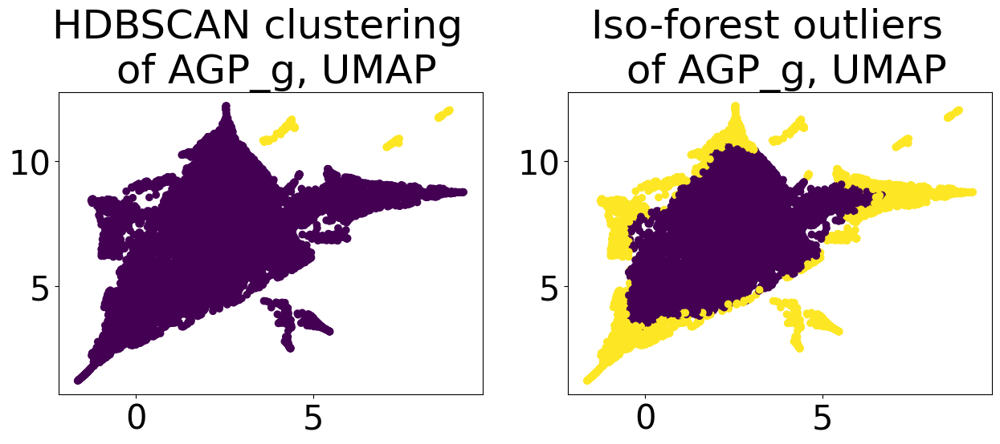

Shards with outliers overlap for AGP_g, UMAP: 1.0


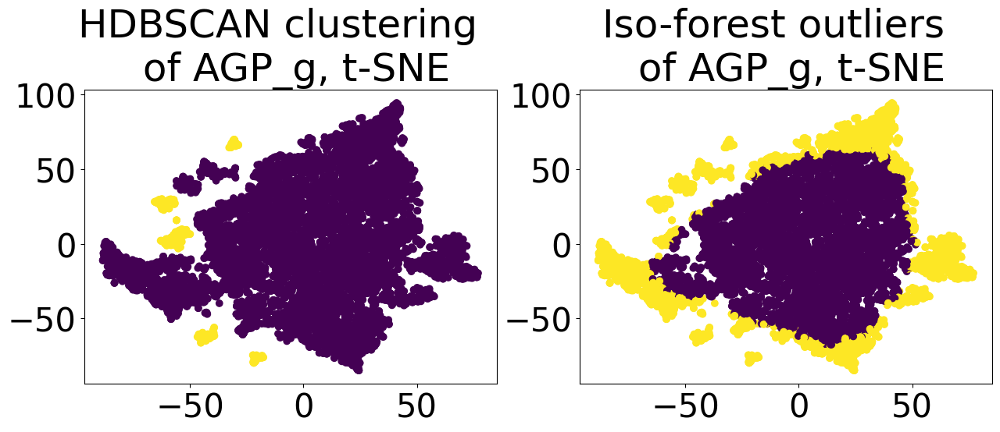

 50%|█████████████████████████████████████████████████████████████████████                                                                     | 1/2 [00:01<00:01,  1.78s/it]

Shards with outliers overlap for AGP_g, t-SNE: 0.9048991354466859


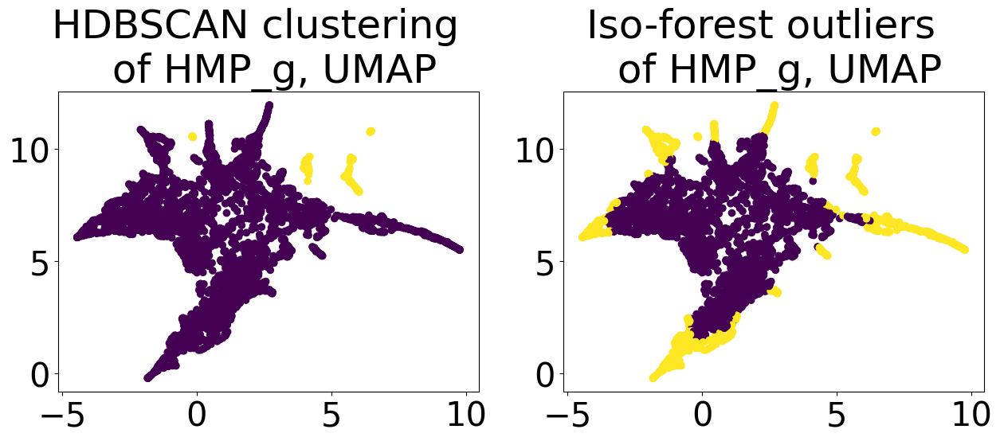

Shards with outliers overlap for HMP_g, UMAP: 0.9935064935064936


In [ ]:
for label, X in tqdm(data_pca.items()):
    
    for embedding_name, embeddings_dict in {'UMAP':Z_umap, 
                                            't-SNE':Z_tsne}.items():
        Z = embeddings_dict[label]
        
        nn = NearestNeighbors(n_neighbors=10)
        nn.fit(Z)
        knn = nn.kneighbors()
        eps=knn[0].max()
        
        clust_method = HDBSCAN(cluster_selection_epsilon=float(eps))
        isoforest = IsolationForest()
        
        y_cl = clust_method.fit_predict(Z)
        y_iso = isoforest.fit_predict(Z)
        
        y_cl_count = Counter(y_cl)
        k_most_common = y_cl_count.most_common(1)[0][0]
        iso_mask = y_iso == -1 # outliers
        cl_mask = y_cl != k_most_common # small clusters
        
        # plotting
        plt.figure(figsize=(15,5), dpi=100)
        ax1 = plt.subplot(1,2,1)
        ax1.scatter(Z[:,0], Z[:,1], c=cl_mask)
        ax1.set_title(f'HDBSCAN clustering  \n of {label}, {embedding_name}')
        
        ax2 = plt.subplot(1,2,2)
        ax2.scatter(Z[:,0], Z[:,1], c=iso_mask)
        ax2.set_title(f'Iso-forest outliers  \n of {label}, {embedding_name}')
        plt.show()
        
        print(f'Shards with outliers overlap for {label}, {embedding_name}:',\
              (cl_mask * iso_mask).sum() / sum(cl_mask))